Atividades
===

Essas atividade são relativas a aulas de extração de atributos e selecão de atributos. 
- Link para video: https://drive.google.com/file/d/13LLQGLt7QsjKshBXgUdJ4RVOT8N252cU/view
- Link para apresentação: https://docs.google.com/presentation/d/1wctFgQe7TSlBEypZbVQqqsfrnpSgOeXPSO-mCJ6jIz4


> Lembre de criar uma `virtualenv` com os `requirements.txt` do repositório.

> Lembre de criar uma `kernel` do jupyter para seus desenvolvimentos

> **MANTENHA** essa arquivo no local padrão do repositório. Detro da pasta **feature_extraction_and_feature_selection**.

> Enviei apenas o seu notebook para correção. Não é necessário enviar nenhum outro arquivo. Siga o padrão `Atividades-<NOME-DO-ALUNO>.ipynb`

# Feature Extraction

## 1. Realizar a extração de atributos utilzando as técnicas Fourier e HOS nas bases de dados

- Dados de falhas em aerogeradores

As orientações abaixo devem ser seguidas antes de iniciar os trabalhos

> Todo os arquivos nomeados com `v000_ ... .csv` são referentes a essa base.

> A classe referente ao dado está representada por uma TAG no nome do arquivo da seguinte forma: `v000_NORMAL_ ... .csv` é o dado referente a classe de funcionamento normal do gerador. A TAG `v000_SC_LI_LVL3_ ... .csv` é a classe referente a falha tipo 1 e continua. Não se preocupem com a ordem de enumeração das classes nesse momento.

> Há 5 arquivos na pasta.

> Utilizar as colunas a `Current_R`, `Current_S`, `Current_T` para realizar extração de atributos. Perceba que cada coluna é referente a uma sinal de corrente elétrica, portanto cada um são representados vetores de dimensões $1x50000$.

> Antes de realizar a extração de atributos deve-se dividir cada sinal em 10 partes de tamanho $1x5000$. A ideia aqui é aumentar o número de amostra da base de dados por 10. Pense que cada parte é um recorte do sinal, e ao serem concatenadas retornarão o sinal original.

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from os import path
from pandas_profiling import ProfileReport
from collections import Counter
from scipy.stats import mode

In [2]:
!git clone https://github.com/navarmn/feature_extraction_signal.git

fatal: destination path 'feature_extraction_signal' already exists and is not an empty directory.


In [3]:
!git clone https://github.com/navarmn/feature_selection_framework.git

fatal: destination path 'feature_selection_framework' already exists and is not an empty directory.


In [4]:
from feature_extraction_signal.src import feature_extraction
from feature_selection_framework.src.feature_selection import *

### Carregue a base

In [5]:
DATAFOLDER = path.join('..', '..', 'data')
DATAFILES = [
    'v000_FAULT_SC_HI_LVL2_FR6000_FG5942_L000_0,6IN_SENSORC.csv',
    'v000_FAULT_SC_LI_LVL3_FR4500_FG4365_L000_0,8IN_SENSORC.csv',
    'v000_FAULT_SC_LI_LVL3_FR6000_FG5927_L000_0,4IN_SENSORC.csv',
    'v000_NORMAL_FR4500_FG4385_L000_1,0IN_SENSORC.csv',
    'v000_NORMAL_FR6000_FG5955_L000_0,5IN_SENSORC.csv'
]

ATTRIBUTES = ['Current_R', 'Current_S', 'Current_T']

SEED = 1987298712

In [6]:
data_fault_LVL2_FG5942 = pd.read_csv(path.join(DATAFOLDER, DATAFILES[0]))
data_fault_LVL3_FG4365 = pd.read_csv(path.join(DATAFOLDER, DATAFILES[1]))
data_fault_LVL3_FG5927 = pd.read_csv(path.join(DATAFOLDER, DATAFILES[2]))
data_normal_FG4385 = pd.read_csv(path.join(DATAFOLDER, DATAFILES[3]))
data_normal_FG5955 = pd.read_csv(path.join(DATAFOLDER, DATAFILES[4]))
print(data_fault_LVL2_FG5942.shape)
print(data_fault_LVL3_FG4365.shape)
print(data_fault_LVL3_FG5927.shape)
print(data_normal_FG4385.shape)
print(data_normal_FG5955.shape)

(50000, 14)
(50000, 14)
(50000, 14)
(50000, 14)
(50000, 14)


In [7]:
def split_dataset(dataset, init_start, init_end, jump):
    num_iterations = dataset.shape[0]/jump
    num_iterations = int(num_iterations)
    dataset_splited = []
    for i in range(num_iterations):
        currents = dataset.iloc[:, 0:3]
        dataset_splited.append(currents.loc[init_start:init_end])
        init_start = init_end
        init_end += jump
        
    return dataset_splited

In [8]:
def check_shape(dataset):
    for idx, value in enumerate(dataset):
        print(dataset[idx].shape)

In [9]:
data_fault_LVL2_FG5942_splited = split_dataset(data_fault_LVL2_FG5942, 0, 4999, 4999)
data_fault_LVL3_FG4365_splited = split_dataset(data_fault_LVL3_FG4365, 0, 4999, 4999)
data_fault_LVL3_FG5927_splited = split_dataset(data_fault_LVL3_FG5927, 0, 4999, 4999)
data_normal_FG4385_splited = split_dataset(data_normal_FG4385, 0, 4999, 4999)
data_normal_FG5955_splited = split_dataset(data_normal_FG5955, 0, 4999, 4999)

# check_shape(data_fault_LVL2_FG5942_splited)
# check_shape(data_fault_LVL3_FG4365_splited)
# check_shape(data_fault_LVL3_FG5927_splited)
# check_shape(data_normal_FG4385_splited)
# check_shape(data_normal_FG5955_splited)

### a) Comparativo da média do sinal e sua distribuição

- Realize o calculo da média e desvio padrão em cada um dos sinais e exiba o resultado em um dataframe. Discuta suas conclusões.

**help**: utilize as funcões nativas do numpy ou do pandas. Lembre que o sinal é uma senoide, qual a média em uma senoide simétrica?

### 🔰 Informações sobre os dados normais

In [10]:
"""
Para não estender muito o notebook mostrando a média de cada uma das dez partes, decidi fazer um describe mostrando 
a média e a desvio padrão dos dois datasets normais completos.

data_normal_FG4385
data_normal_FG5955
"""

data_normal_FG4385.iloc[:,0:3].describe()
# print(data_normal_FG4385.mean())
# print(data_normal_FG4385.std())

,Current_R,Current_S,Current_T
count,50000.000000,50000.000000,50000.000000
mean,-0.004971,0.008693,-0.000370
std,2.906368,2.920372,2.986475
min,-5.690234,-5.309218,-6.627328
25%,-2.954530,-2.954989,-2.988117
50%,-0.002516,0.010068,0.002143
75%,2.936774,2.949673,2.992404
max,5.723374,6.652812,6.682512


In [11]:
data_normal_FG5955.iloc[:, 0:3].describe()
# print(data_normal_FG5955.mean())
# print(data_normal_FG5955.std())

,Current_R,Current_S,Current_T
count,50000.000000,50000.000000,50000.000000
mean,-0.010286,0.012611,0.002357
std,1.184251,1.188874,1.197354
min,-2.610977,-3.031342,-3.497098
25%,-1.185867,-1.173410,-1.181236
50%,-0.015240,-0.002658,0.002143
75%,1.180835,1.206271,1.198247
max,3.140361,3.229635,3.654078


#### ☝️ Acima temos as informações da média (mean) e do desvio padrão (std) dos sinais da maquina normal.
`data_normal_FG4385 |  data_normal_FG5955`
- Current_R 

`mean -0.004971 | -0.010286`

`std 2.906368 | 1.184251`
- Current_S

`mean 0.008693 | 0.012611`

`std 2.920372 | 1.188874`
- Current_T

`mean -0.000370 | 0.002357`

`std 2.986475 | 1.197354`

In [12]:
def describe_all_parts(dataset_splited):
    for idx, value in enumerate(dataset_splited):
        print('Parte {}'.format(idx + 1))
        print(dataset_splited[idx].describe())
        print()

In [13]:
#NÃO É NECESSÁRIO
"""
Caso seja necessário visualizar a média e a desvio padrão de cada uma das partes dos datasets, a função 
describe_all_parts() consegue fazer isso.

data_normal_FG4385_splited
data_normal_FG5955_splited
"""
# print('data_normal_FG4385_splited')
# describe_all_parts(data_normal_FG4385_splited)
# print('data_normal_FG5955_splited')
# describe_all_parts(data_normal_FG5955_splited)

'\nCaso seja necessário visualizar a média e a desvio padrão de cada uma das partes dos datasets, a função \ndescribe_all_parts() consegue fazer isso.\n\ndata_normal_FG4385_splited\ndata_normal_FG5955_splited\n'

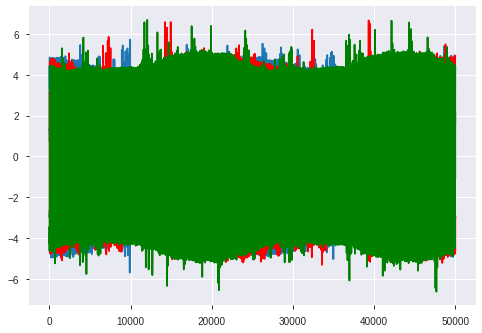

In [14]:
# data_normal_FG4385
# %matplotlib qt
plt.plot(data_normal_FG4385['Current_R'])
plt.plot(data_normal_FG4385['Current_S'], color='red')
plt.plot(data_normal_FG4385['Current_T'], color='green')

plt.show()

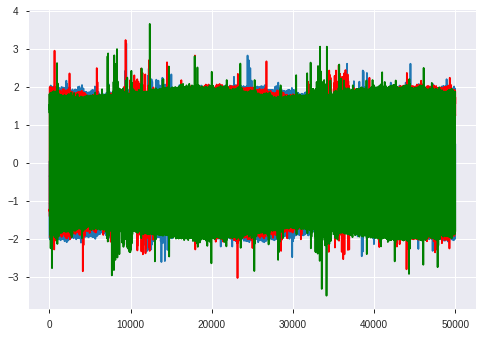

In [15]:
# data_normal_FG5955
# %matplotlib qt
plt.plot(data_normal_FG5955['Current_R'])
plt.plot(data_normal_FG5955['Current_S'], color='red')
plt.plot(data_normal_FG5955['Current_T'], color='green')

plt.show()

### 🔰 Informações sobre os dados com falha

In [16]:
"""
Para não estender muito o notebook mostrando a média de cada uma das dez partes, decidi fazer um describe mostrando 
a média e a desvio padrão dos dois datasets normais completos.

data_fault_LVL2_FG5942
data_fault_LVL3_FG4365
data_fault_LVL3_FG5927
"""
# data_fault_LVL2_FG5942
data_fault_LVL2_FG5942.iloc[:,0:3].describe()
# print(data_fault_LVL2_FG5942.mean())
# print(data_fault_LVL2_FG5942.std())

,Current_R,Current_S,Current_T
count,50000.000000,50000.000000,50000.000000
mean,-0.010241,0.011214,0.001013
std,1.295146,1.211001,1.249040
min,-2.979979,-2.929537,-3.204434
25%,-1.300384,-1.186135,-1.244859
50%,-0.015240,-0.002658,-0.010581
75%,1.282628,1.218996,1.261870
max,2.847705,3.318714,3.972191


In [17]:
# data_fault_LVL3_FG4365
data_fault_LVL3_FG4365.iloc[:,0:3].describe()
# print(data_fault_LVL3_FG4365.mean())
# print(data_fault_LVL3_FG4365.std())

,Current_R,Current_S,Current_T
count,50000.000000,50000.000000,50000.000000
mean,-0.008534,0.007155,0.002021
std,3.148909,2.414745,2.460134
min,-5.931993,-4.876549,-5.838408
25%,-3.298084,-2.293259,-2.415514
50%,-0.002516,0.035519,0.002143
75%,3.280328,2.287944,2.432525
max,6.385032,6.041985,5.651827


In [18]:
# data_fault_LVL3_FG5927
data_fault_LVL3_FG5927.iloc[:,0:3].describe()
# print(data_fault_LVL3_FG5927.mean())
# print(data_fault_LVL3_FG5927.std())

,Current_R,Current_S,Current_T
count,50000.000000,50000.000000,50000.000000
mean,-0.010811,0.013276,0.001277
std,1.560900,1.293425,1.110931
min,-3.221739,-2.891361,-2.962668
25%,-1.593041,-1.224312,-1.079440
50%,-0.027964,-0.002658,-0.010581
75%,1.588009,1.244447,1.096451
max,3.242155,3.764109,3.666803


#### ☝️ Acima temos as informações da média (mean) e do desvio padrão (std) dos sinais da maquina com falha.
`data_fault_LVL2_FG5942 | data_fault_LVL3_FG4365 | data_fault_LVL3_FG5927`
- Current_R 

`mean -0.010241 | -0.008534 | -0.010811`

`std 1.295146 | 3.148909 | 1.560900`
- Current_S

`mean 0.011214 | 0.007155 | 0.013276`

`std 1.211001 | 2.414745 | 1.293425`
- Current_T

`mean 0.001013 | 0.002021 | 0.001277`

`std 1.295146 | 3.148909 | 1.560900`

In [19]:
#NÃO É NECESSÁRIO
"""
Caso seja necessário visualizar a média e a desvio padrão de cada uma das partes dos datasets, a função 
describe_all_parts() consegue fazer isso.

data_fault_LVL2_FG5942_splited
data_fault_LVL3_FG4365_splited
data_fault_LVL3_FG5927_splited
"""
# print('data_fault_LVL2_FG5942_splited')
# describe_all_parts(data_fault_LVL2_FG5942_splited)
# print('data_fault_LVL3_FG4365_splited')
# describe_all_parts(data_fault_LVL3_FG4365_splited)
# print('data_fault_LVL3_FG5927_splited')
# describe_all_parts(data_fault_LVL3_FG5927_splited)

'\nCaso seja necessário visualizar a média e a desvio padrão de cada uma das partes dos datasets, a função \ndescribe_all_parts() consegue fazer isso.\n\ndata_fault_LVL2_FG5942_splited\ndata_fault_LVL3_FG4365_splited\ndata_fault_LVL3_FG5927_splited\n'

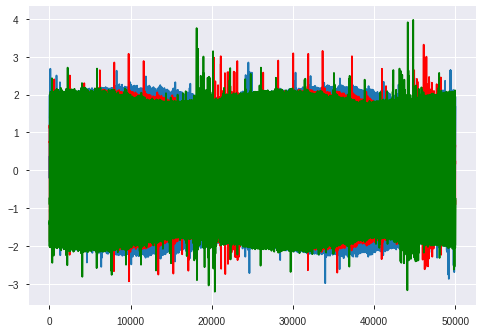

In [20]:
# data_fault_LVL2_FG5942
# %matplotlib qt
plt.plot(data_fault_LVL2_FG5942['Current_R'])
plt.plot(data_fault_LVL2_FG5942['Current_S'], color='red')
plt.plot(data_fault_LVL2_FG5942['Current_T'], color='green')

plt.show()

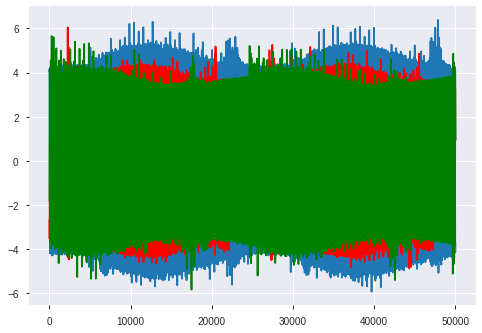

In [21]:
# data_fault_LVL3_FG4365
# %matplotlib qt
plt.plot(data_fault_LVL3_FG4365['Current_R'])
plt.plot(data_fault_LVL3_FG4365['Current_S'], color='red')
plt.plot(data_fault_LVL3_FG4365['Current_T'], color='green')

plt.show()

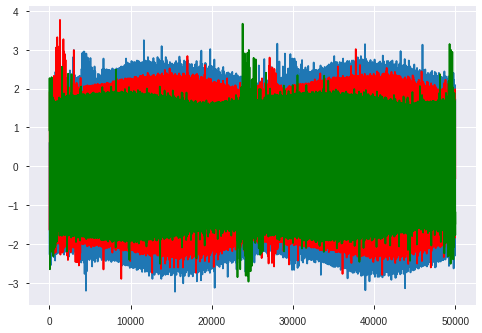

In [22]:
# data_fault_LVL3_FG5927
# %matplotlib qt
plt.plot(data_fault_LVL3_FG5927['Current_R'])
plt.plot(data_fault_LVL3_FG5927['Current_S'], color='red')
plt.plot(data_fault_LVL3_FG5927['Current_T'], color='green')

plt.show()

# 📚 Conclusão
`data_normal_FG4385|data_normal_FG5955|data_fault_LVL2_FG5942|data_fault_LVL3_FG4365|data_fault_LVL3_FG5927`
- Current_R 

mean <font color='green'>-0.004971</font> | <font color='green'>-0.010286</font> | <font color='red'>-0.010241</font> | <font color='red'>-0.008534</font> | <font color='red'>-0.010811</font>

std <font color='green'>2.906368</font> | <font color='green'>1.184251</font> | <font color='red'>1.295146</font> | <font color='red'>3.148909</font> | <font color='red'>1.560900</font>

- Current_S

mean <font color='green'>0.008693</font> | <font color='green'>0.012611</font> | <font color='red'>0.011214</font> | <font color='red'>0.007155</font> | <font color='red'>0.013276</font>

std <font color='green'>2.920372</font> | <font color='green'>1.188874</font> | <font color='red'>1.211001</font> | <font color='red'>2.414745</font> | <font color='red'>1.293425</font>

- Current_T

mean <font color='green'>-0.000370</font> | <font color='green'>0.002357</font> | <font color='red'>0.001013</font> | <font color='red'>0.002021</font> | <font color='red'>0.001277</font>

std <font color='green'>2.986475</font> | <font color='green'>1.197354</font> | <font color='red'>1.295146</font> | <font color='red'>3.148909</font> | <font color='red'>1.560900</font>

`Somente a média e o desvio padrão não são o suficiente para tirar alguma conclusão sobre essa base de dados, como podemos ver acima os dados verdes (normais) e os vermelhos (maquina com algum tipo de falha), até mesmo as maquinas com falha apresetam uma média e um desvio padrão bem similuar aos sinais normais. Porém com a plotagem de como os sinais se distribuem é possível enxergar onde as correntes se diferenciam.`

### b) Extração de atributos no sinal

- Utilize o código de `feature_extraction_signal` em: https://github.com/navarmn/feature_extraction_signal
- Use as classes `Fourier` e `HOS` de maneira adequada. Lembre do método `.transform()`.
- Na classe `Fourier`utilize os parâmetros: `fs=500`; o valor de fundamental está na TAG do nome em `_FG5955_`significa `fundamental=59.55`. `harmonics=(0.5, 1, 1.5, 2.5, 3, 5, 7)`, mas sintam-se à vontade para buscar outras harmônicas;
- Os rótulos devem serem impostos de acordo com a descrição da tag feita cima. 
- Monte um dataframe que contenham os atributos em cada coluna e a útlima com o rótulo. Concatene os artibutos extraídos da `Current_R`, `Current_S` e `Current_T`.
- Deverá ser feito um dataframe para os atributos de Fourier e um para os atributos de HOS.

In [23]:
def transform_all_attributes(datafiles, fund):
    fe_fourier = feature_extraction.Fourier(fundamental=fund, fs=500.0, harmonics=(0.5, 1, 1.5, 2.5, 3, 5, 7))
    fe_hos = feature_extraction.HOS()
    
    fourier_list = []
    hos_list = []
    for idx,value in enumerate(datafiles):
        data = value
        aux_fourier = []
        aux_hos = []
        for data_attribute in ATTRIBUTES:
            feature_vector_fourier = fe_fourier.transform(data[data_attribute])
            aux_fourier.append(feature_vector_fourier['features'])

            feature_vector_hos = fe_hos.transform(data[data_attribute])
            aux_hos.append(feature_vector_hos['features'])
        aux1 = []
        for i in aux_fourier:
            for idx, value in enumerate(i):
                aux1.append(value)
            
        fourier_list.append(aux1)
                
        aux2 = []
        for j in aux_hos:
            for idx, value in enumerate(j):
                aux2.append(value)
            
        hos_list.append(aux2)
        
        
#     ,'0.5', '1', '1.5', '2.5', '3', '5', '7','0.5', '1', '1.5', '2.5', '3', '5', '7'
    fourier_df = pd.DataFrame(data=fourier_list, columns=['Current_R_0.5', 'Current_R_1', 'Current_R_1.5','Current_R_2.5', 'Current_R_3', 'Current_R_5', 'Current_R_7','Current_S_0.5', 'Current_S_1', 'Current_S_1.5','Current_S_2.5', 'Current_S_3', 'Current_S_5', 'Current_S_7','Current_T_0.5', 'Current_T_1', 'Current_T_1.5','Current_T_2.5', 'Current_T_3', 'Current_T_5', 'Current_T_7'])
#     ,'rms', 'skewness', 'kurtosis', 'variance','rms', 'skewness', 'kurtosis', 'variance'
    hos_df = pd.DataFrame(data=hos_list, columns=['Current_R_rms', 'Current_R_skewness', 'Current_R_kurtosis', 'Current_R_variance','Current_S_rms', 'Current_S_skewness', 'Current_S_kurtosis', 'Current_S_variance','Current_T_rms', 'Current_T_skewness', 'Current_T_kurtosis', 'Current_T_variance'])

    return fourier_df, hos_df

In [24]:
"""
data_fault_LVL2_FG5942_splited
data_fault_LVL3_FG4365_splited
data_fault_LVL3_FG5927_splited
data_normal_FG4385_splited
data_normal_FG5955_splited
"""
# data_fault_LVL2_FG5942_splited
# Fourier | HOS
data_fault_LVL2_FG5942_fourier, data_fault_LVL2_FG5942_hos = transform_all_attributes(data_fault_LVL2_FG5942_splited, 59.42)

# data_fault_LVL3_FG4365_splited
# Fourier | HOS
data_fault_LVL3_FG4365_fourier, data_fault_LVL3_FG4365_hos = transform_all_attributes(data_fault_LVL3_FG4365_splited, 43.65)

# data_fault_LVL3_FG5927_splited
# Fourier | HOS
data_fault_LVL3_FG5927_fourier, data_fault_LVL3_FG5927_hos = transform_all_attributes(data_fault_LVL3_FG5927_splited, 59.27)

# data_normal_FG4385_splited
# Fourier | HOS
data_normal_FG4385_fourier, data_normal_FG4385_hos = transform_all_attributes(data_normal_FG4385_splited, 43.85)

# data_normal_FG5955_splited
# Fourier | HOS
data_normal_FG5955_fourier, data_normal_FG5955_hos = transform_all_attributes(data_normal_FG5955_splited, 59.55)


fourier_for_analysis = pd.concat((data_normal_FG4385_fourier, data_normal_FG5955_fourier, data_fault_LVL2_FG5942_fourier, data_fault_LVL3_FG4365_fourier, data_fault_LVL3_FG5927_fourier), axis=0, sort=False)
fourier_for_analysis.set_index(x for x in range(0,50))
# print(fourier_for_analysis)

hos_for_analysis = pd.concat((data_normal_FG4385_hos, data_normal_FG5955_hos, data_fault_LVL2_FG5942_hos, data_normal_FG4385_hos, data_normal_FG5955_hos), axis=0, sort=False)
hos_for_analysis.set_index(x for x in range(0,50))
# print(hos_for_analysis)

,Current_R_rms,Current_R_skewness,Current_R_kurtosis,Current_R_variance,Current_S_rms,Current_S_skewness,Current_S_kurtosis,Current_S_variance,Current_T_rms,Current_T_skewness,Current_T_kurtosis,Current_T_variance
0,2.919062,8.522613,-0.006956,-1.455988,2.911069,8.476016,-0.000401,-1.484746,2.974108,8.846538,-0.014169,-1.475827
1,2.913679,8.491116,-0.008763,-1.473713,2.902792,8.427882,-0.002815,-1.489470,2.967523,8.807771,-0.001669,-1.480459
2,2.869002,8.232680,-0.006563,-1.498323,2.915174,8.499063,-0.000953,-1.499540,2.990523,8.944864,0.004735,-1.423216
3,2.909531,8.467049,-0.005992,-1.493886,2.936045,8.621951,-0.008534,-1.456420,3.000252,9.003254,-0.002525,-1.396831
4,2.912080,8.481699,0.004710,-1.439868,2.932456,8.600530,-0.014152,-1.437018,2.998492,8.992739,-0.009186,-1.439023
5,2.913100,8.487546,0.001518,-1.448689,2.923426,8.547964,-0.007810,-1.490173,2.980209,8.883214,-0.018040,-1.477019
6,2.921869,8.539027,-0.004301,-1.482973,2.902205,8.424386,-0.004016,-1.489768,2.966977,8.804709,-0.013427,-1.473803
7,2.875374,8.269274,-0.007065,-1.496864,2.909108,8.464435,0.004042,-1.491616,2.994554,8.969145,-0.000081,-1.438290
8,2.907344,8.454317,-0.014604,-1.491816,2.942746,8.661476,-0.000653,-1.464525,3.003926,9.025275,-0.001572,-1.391156
9,2.924274,8.553081,-0.004434,-1.448475,2.927069,8.569127,-0.014694,-1.436449,2.985865,8.917091,-0.001477,-1.433673


In [25]:
# data_fault_LVL2_FG5942_splited
# Fourier + HOS
data_fault_LVL2_FG5942_full = pd.concat([data_fault_LVL2_FG5942_fourier, data_fault_LVL2_FG5942_hos], axis=1, sort=False)

# data_fault_LVL3_FG4365_splited
# Fourier + HOS
data_fault_LVL3_FG4365_full = pd.concat([data_fault_LVL3_FG4365_fourier, data_fault_LVL3_FG4365_hos], axis = 1, sort=False)

# data_fault_LVL3_FG5927_splited
# Fourier + HOS
data_fault_LVL3_FG5927_full = pd.concat([data_fault_LVL3_FG5927_fourier, data_fault_LVL3_FG5927_hos], axis=1, sort=False)

# data_normal_FG4385_splited
# Fourier + HOS
data_normal_FG4385_full = pd.concat([data_normal_FG4385_fourier, data_normal_FG4385_hos], axis=1, sort=False)

# data_normal_FG5955_splited
# Fourier + HOS
data_normal_FG5955_full = pd.concat([data_normal_FG5955_fourier, data_normal_FG5955_hos], axis=1, sort=False)

full_data_for_analysis = pd.concat([data_normal_FG4385_full, data_normal_FG5955_full, data_fault_LVL2_FG5942_full, data_fault_LVL3_FG4365_full, data_fault_LVL3_FG5927_full], axis=0, sort=False)
full_data_for_analysis.set_index(x for x in range(0,50))

,Current_R_0.5,Current_R_1,Current_R_1.5,Current_R_2.5,Current_R_3,Current_R_5,Current_R_7,Current_S_0.5,Current_S_1,Current_S_1.5,...,Current_R_kurtosis,Current_R_variance,Current_S_rms,Current_S_skewness,Current_S_kurtosis,Current_S_variance,Current_T_rms,Current_T_skewness,Current_T_kurtosis,Current_T_variance
0,0.012922,0.013092,0.016014,0.031793,0.042502,0.483972,0.055189,0.023371,0.027026,0.034543,...,-0.006956,-1.455988,2.911069,8.476016,-0.000401,-1.484746,2.974108,8.846538,-0.014169,-1.475827
1,0.028132,0.031044,0.033613,0.045653,0.058200,0.501249,0.034273,0.016863,0.026751,0.029125,...,-0.008763,-1.473713,2.902792,8.427882,-0.002815,-1.489470,2.967523,8.807771,-0.001669,-1.480459
2,0.027747,0.025790,0.033216,0.047479,0.063245,0.552246,0.034701,0.006131,0.016682,0.019050,...,-0.006563,-1.498323,2.915174,8.499063,-0.000953,-1.499540,2.990523,8.944864,0.004735,-1.423216
3,0.013687,0.009635,0.019992,0.032922,0.048226,0.501186,0.037219,0.025165,0.023493,0.029842,...,-0.005992,-1.493886,2.936045,8.621951,-0.008534,-1.456420,3.000252,9.003254,-0.002525,-1.396831
4,0.024481,0.020717,0.032893,0.039639,0.048043,0.468355,0.032115,0.020045,0.027388,0.024922,...,0.004710,-1.439868,2.932456,8.600530,-0.014152,-1.437018,2.998492,8.992739,-0.009186,-1.439023
5,0.029174,0.025636,0.029055,0.036935,0.051336,0.481068,0.033807,0.006825,0.006875,0.011709,...,0.001518,-1.448689,2.923426,8.547964,-0.007810,-1.490173,2.980209,8.883214,-0.018040,-1.477019
6,0.012628,0.011914,0.017672,0.028624,0.043507,0.499050,0.040025,0.036993,0.026200,0.027579,...,-0.004301,-1.482973,2.902205,8.424386,-0.004016,-1.489768,2.966977,8.804709,-0.013427,-1.473803
7,0.038723,0.034143,0.029245,0.040004,0.067188,0.560712,0.041534,0.036354,0.030842,0.031362,...,-0.007065,-1.496864,2.909108,8.464435,0.004042,-1.491616,2.994554,8.969145,-0.000081,-1.438290
8,0.037718,0.029860,0.035037,0.036830,0.052861,0.492966,0.039165,0.012618,0.009526,0.012748,...,-0.014604,-1.491816,2.942746,8.661476,-0.000653,-1.464525,3.003926,9.025275,-0.001572,-1.391156
9,0.004989,0.009720,0.013867,0.025753,0.038867,0.477080,0.050175,0.021631,0.021156,0.020014,...,-0.004434,-1.448475,2.927069,8.569127,-0.014694,-1.436449,2.985865,8.917091,-0.001477,-1.433673


### c) Análise exploratória na base criada com os extratores de atributos
- Use a ferramenta `pandas-profiling` https://github.com/pandas-profiling/pandas-profiling
- Faça um resumo do relatório, destacando os principais pontos gerados na base.
- Faça uma análise para cada uma das bases:
    1. Features criada com Fourier
    2. Features criada com HOS
    3. Combinação das duas features (Fourier + HOS). 
> Dica: dê atenção ao coeficiente de correlação.

### 🔰 Informações sobre os dados normais (Fourier)

In [26]:
# fourier_for_analysis
profile_fourier = ProfileReport(fourier_for_analysis, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile_fourier.to_notebook_iframe()

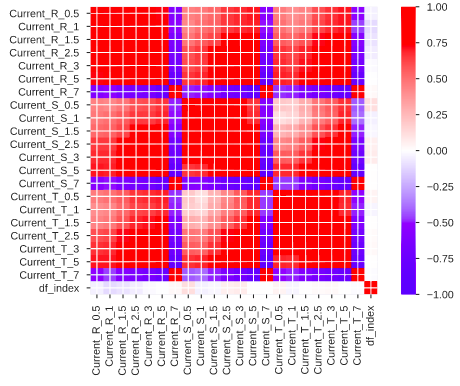

In [27]:
# hos_for_analysis
profile_hos = ProfileReport(hos_for_analysis, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile_hos.to_notebook_iframe()

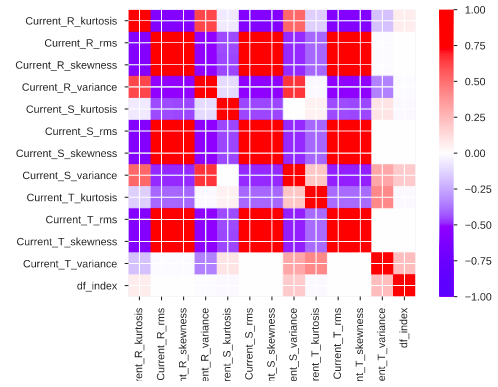

In [27]:
# full_data_for_analysis
profile_full_data = ProfileReport(full_data_for_analysis, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile_full_data.to_notebook_iframe()

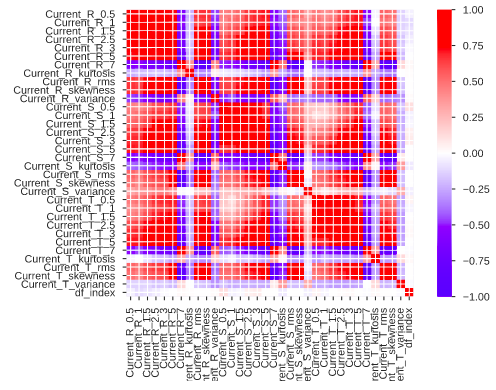

## Análise em cima da concatenação de todos os dados. (full_data_for_analysis)

É facilmente observável que há sim algumas correlação positivas sim, como é no caso do fourier que as harmônicas de valores 0.5, 1, 1.5, 3 e 5 correlacionam-se muito bem, diferente da harmônica de valor 7 que tem baixa correlação em relação as outras, isso é recorrente em todas as correntes, tanto a R, S e T.Podemos ver também que as correntes S e T tem um correlação mais branda (próxima de 0). Quando se trata das extrações do HOS, tem que RMS e SKEWNESS já não se relacionam tão bem com o valor de KURTOSIS também para todas as correntes.

# Feature Selection

## 1. Realizar um estudo de relevância de atributos utilzando as técnicas exibidas na aula.

Nesse momento utilize a base de dados `Clinical_data_09-09-19-processed.csv`. Uma breve descrição da base:
- Contém um histórico dos registros de pacientes acometidos com uma determinada patologia.
- Os registros são variados, vão desde resposta de questionários médicos de anamnese, por exemplo, "*É fumante nos últimos 5 anos?*", "*Faz uso de álcool constantemente?*", até resultados de exames clínicos como ECG e Ecocardiograma.
- O rótulo dessa base é a coluna `Óbito`.

### Carregue a base

In [29]:
DATAFOLDER = path.join('..', '..', 'data')

FEATURES_CLINICA_HISTORIA_PREVIA = [
       'Cancer', 'HAS', 'DM2', 'Cardiopatia Outra',
       'Marcapasso', 'Sincope', 'Fibrilação/Flutter Atrial', 'I R Crônica',
       'DLP', 'Coronariopatia', 'Embolia Pulmonar', 'Ins Cardiaca ', 'AVC',
       'DVP', 'TSH', 'Tabagismo', 'Alcoolismo', 'Sedentarismo']

In [30]:
clinical_data = pd.read_csv(path.join(DATAFOLDER, 'Clinical_data_09-09-19-processed.csv'))
clinical_data.head()

,Paciente,Nome do Paciente,Prontuario,Date Nasc,Sexo,Nat.,BMI,Cancer,HAS,DM2,...,Disf Diastolica,Deficit Seg,NYHA,Rassi pontos,Rassi escore,Diretriz 2005,CDI,Ablações,Amiodarona,Obito
0,NaN,Adão Severo de Souza,333104.0,29/11/1950,1.0,PI,25,0,1.0,1.0,...,1,0,1,2.0,1.0,1.0,0,0,0,0.0
1,NaN,Adão Severo de Souza,333104.0,29/11/1950,1.0,PI,23,0,1.0,1.0,...,1,0,1,2.0,1.0,1.0,0,0,0,0.0
2,NaN,Adão Severo de Souza,333104.0,29/11/1950,1.0,PI,24,0,1.0,1.0,...,1,0,1,2.0,1.0,1.0,0,0,0,0.0
3,NaN,Adão Severo de Souza,333104.0,29/11/1950,1.0,PI,26,0,1.0,1.0,...,1,0,1,2.0,1.0,1.0,0,0,0,0.0
4,NaN,Adão Severo de Souza,333104.0,29/11/1950,1.0,PI,25,0,1.0,1.0,...,1,0,1,2.0,1.0,1.0,0,0,0,0.0


In [31]:
X = clinical_data[FEATURES_CLINICA_HISTORIA_PREVIA]
y = clinical_data["Obito"]

### a) Análise exploratória na base de dados
- Use a ferramenta `pandas-profiling` https://github.com/pandas-profiling/pandas-profiling
- Faça um resumo do relatório, destacando os principais pontos gerados na base.

In [32]:
# clinical_data
profile_clinical = ProfileReport(X, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile_clinical.to_notebook_iframe()

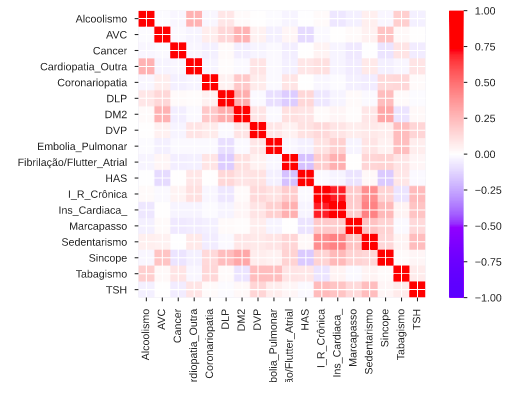

## Análise em cima do dataset de dados clinicos. (clinical_data)
 'Cancer', 'HAS', 'DM2', 'Cardiopatia Outra',
       'Marcapasso', 'Sincope', 'Fibrilação/Flutter Atrial', 'I R Crônica',
       'DLP', 'Coronariopatia', 'Embolia Pulmonar', 'Ins Cardiaca ', 'AVC',
       'DVP', 'TSH', 'Tabagismo', 'Alcoolismo', 'Sedentarismo'
       
Diferente do dataset analisado anteriormente esse tem menos correlações tão fortes, porém ainda há informações importantes de se destacar. I_R_cronica e Ins_cardiaca tem maior correlação apresentada aqui, o uso de marcapasso e o sedentarismo também tem uma correlação razoável com Ins_cardiaca e I_R_cronica, outro importante salientar é a correlação de Cardiopartia_outra com o alcolismo e um das que é observado que tem mais correlações "fortes" é o  TSH que tem correlação com I_R_cronica, ins_cardiaca,  marcapasso e sedentarismo.

### b) Identicar qual a variáveis parecem influenciar no óbito dos pacientes :(
- Utilize o código `feature_selection_framework` https://github.com/navarmn/feature_selection_framework 
- Monte o resultado em um `DataFrame`, as colunas serão referentes aos métodos e as linhas deverão ser os atributos. Coloque 1 quando o método indicar como relevante e 0 quando o método indicar com não relevante;
- Utilize o seguinte critério para validar um atributo como relevante: moda >= 3

In [33]:
def join_datasets(vec):
    ret = []
    for idx, value in enumerate(vec):
        for i in value:
            ret.append(i)
    return ret

def convert(dictionary):
    ret = []
    for i in dictionary:
        aux = []
        aux.append(i)
        aux.append(dictionary[i])
        ret.append(aux)
    return np.array(ret)

In [36]:
# Correlation

aux = []

fs = Correlation()
fs.fit(X, y)
print("By correlation: {}".format(fs.relevant_features))
aux.append(np.array(fs.relevant_features))

# Backward Elimination (BE)
fs = BackwardElimination()
fs.fit(X, y)
print("By Backward Elimination: {}".format(fs.relevant_features))
aux.append(np.array(fs.relevant_features))

# Recursive Feature Elimination (RFE)
fs = RecursiveFeatureElimination()
fs.fit(X, y)
print("By Recursive Feature Elimination: {}".format(fs.relevant_features))
aux.append(np.array(fs.relevant_features))

# ANOVA
fs = ANOVA()
fs.fit(X, y)
print("By Anova: {}".format(fs.relevant_features))
aux.append(np.array(fs.relevant_features))

# Embedded
fs = Embedded()
fs.fit(X, y)
print("By Embedded: {}".format(fs.relevant_features))
aux.append(np.array(fs.relevant_features))

# Ensemble
fs = Ensemble()
fs.fit(X, y)
print("By Ensemble: {}".format(fs.relevant_features))
aux.append(np.array(fs.relevant_features))
print('------------------------------------------------------------------------')
print(aux)
print('------------------------------------------------------------------------')
join = join_datasets(aux)
counter = Counter(join)
print(counter)

data = convert(counter)
df = pd.DataFrame(data, columns=['Variáveis', 'Ocorrência'])
df.set_index('Variáveis')
df

By correlation: ['I_R_Crônica' 'Ins_Cardiaca_' 'Obito']
By Backward Elimination: ['Ins_Cardiaca_']
Optimum number of features: 5
Score with 5 features: 0.082483
By Recursive Feature Elimination: ['Cardiopatia_Outra' 'Ins_Cardiaca_' 'DVP' 'Tabagismo' 'Alcoolismo']
By Anova: Index(['Ins_Cardiaca_'], dtype='object')
Best alpha using built-in LassoCV: 0.013854
Best score using built-in LassoCV: 0.067040
Lasso picked 3 variables and eliminated the other 15 variables
By Embedded: ['DM2' 'I_R_Crônica' 'Ins_Cardiaca_']
By Ensemble: Index(['TSH', 'Ins_Cardiaca_', 'Sincope'], dtype='object')
------------------------------------------------------------------------
[array(['I_R_Crônica', 'Ins_Cardiaca_', 'Obito'], dtype=object), array(['Ins_Cardiaca_'], dtype='<U13'), array(['Cardiopatia_Outra', 'Ins_Cardiaca_', 'DVP', 'Tabagismo',
       'Alcoolismo'], dtype=object), array(['Ins_Cardiaca_'], dtype=object), array(['DM2', 'I_R_Crônica', 'Ins_Cardiaca_'], dtype=object), array(['TSH', 'Ins_Cardiaca_'

,Variáveis,Ocorrência
0,I_R_Crônica,2
1,Ins_Cardiaca_,6
2,Obito,1
3,Cardiopatia_Outra,1
4,DVP,1
5,Tabagismo,1
6,Alcoolismo,1
7,DM2,1
8,TSH,1
9,Sincope,1


## Análise em cima do resultado dos algoritmos de correlação usados.

Ins_cardiaca <font color='red'>6 vezes</font> | Única maior que 3

I_R_cronica <font color='red'>2 vezes</font>

Como foi conseguir analisar no pandas profiling, a variavel I_R_cronica e Ins_cardiaca tem várias correlações com outras variáveis que poderiam levar o paciênte ao óbito, quando fazendo a correlações dessas variáveis com o nossa classe óbito, temos uma resposta talvez já esperada, essas duas variáveis são as que mais se correlacionam com a questão do óbito do paciente. Porém a única que obteve a moda maior que 3, foi a insuficiência cardiaca. :(

## 2. QUESTÃO DESAFIO
- Essa etapa não entrará com atividade avaliativa, pois a base de dados a seguir não é tão bonita quanto parece 🤪. Há muitas etapas de pré-processamento, agrupmaento e mais importante de tudo, o usuário tem que fazer as duas tabelas `weekly-infos-before-shrink.csv` e `user-status-after-shrink.csv` conversarem entre si.
- Fique à vontade para tentar e para tirar dúvidas. 😊

Nesse momento utilize a base de dados `weekly-infos-before-shrink.csv` e `user-status-after-shrink.csv`. Uma breve descrição da base:
- Essa base foi retirada de um serviço de streaming de midia. Os atributos são relativos a perfis de consumo de usuários.
- O objetivo é realizar detecção de *churn* (https://resultadosdigitais.com.br/blog/o-que-e-churn/)
- Possui um registro de 17 semanas de uso e os rótulos estáo na tabela `user-status-after-shrink.csv`, que indicam se ao final do período o usuário cancelou e se manteve assinante.

In [8]:
# code here

### a) Análise exploratória na base de dados
- Use a ferramenta `pandas-profiling` https://github.com/pandas-profiling/pandas-profiling
- Faça um resumo do relatório, destacando os principais pontos gerados na base.
> Exiba a matriz de correlação!

In [9]:
# code here

### b) Identicar qual a variáveis parecem influenciar no cancelamento da assinatura.

- Utilize o código `feature_selection_framework` https://github.com/navarmn/feature_selection_framework 
- Monte o resultado em um `DataFrame`, as colunas serão referentes aos métodos e as linhas deverão ser os atributos. Coloque 1 quando o método indicar como relevante e 0 quando o método indicar com não relevante;
- Utilize o seguinte critério para validar um atributo como relevante: moda >= 3

In [10]:
# code here